## Проектная работа "Исследование рынка заведений общественного питания Москвы"
**Выполнил:** Киселев Дмитрий

**Описание задачи:** 

Инвесторы из одного фонда решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 
Необходимо подготовить исследование рынка, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар — и какими будут расположение, меню и цены. Более детально следует сфокусироваться на кофейнях.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных популярных сервисов на лето 2022 года. Информация могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных**

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

        -«Средний счёт: 1000–1500 ₽»;
        -«Цена чашки капучино: 130–220 ₽»;
        -«Цена бокала пива: 400–600 ₽» и так далее;
       
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

        -Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        -Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        -Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
        
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

        -Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        -Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        -Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
        
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

        -0 — заведение не является сетевым
        -1 — заведение является сетевым
        
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
import numpy as np
from datetime import datetime
import time
import warnings
warnings.filterwarnings("ignore")
import math as mth
import plotly.express as px
from plotly import graph_objects as go
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# подключаем модуль для работы с JSON-форматом
import json
from collections import Counter

**Оглавление**

1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing)
3. [Анализ данных](#analyze)
4. [Категория кафейни, выбор локации](#coffee)
5. [Приложение презентация](#presentation)

### Шаг 1. Открытие файла с данными и изучение общей информации <a id="start"></a>

In [3]:
try:
    df = pd.read_csv(r'C:\Users\kslvd\pyn_projects\yandex_projects\food_invest\moscow_places.csv',index_col = False)
except:
    print('Не удалось загрузить данные.')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Всего в датасете 14 столбцов, 8406 строк, есть пропуски в часах работы, категории цен, среднем чеке, стоимости кофе среднего размера, числе посадочных мест. Большинство столбцов в текстовом и числовом формате, следует поменять форматы для категориальной chain на boolean 

In [6]:
df['chain'] = df['chain'].astype(bool)

In [7]:
print(f'В данных содержатся записи по {df["name"].nunique()} уникальным заведениям, некоторые из них сетевые chain = True.')

В данных содержатся записи по 5614 уникальным заведениям, некоторые из них сетевые chain = True.


### Шаг 2. Предобработка данных <a id="preprocessing"></a>

In [8]:
print('В датасете содержится {0} полных дубликатов или {1} от выборки. Избавимся от них.'.format(df.duplicated().sum(), df.duplicated().sum()/len(df)))
df.drop_duplicates(inplace=True)

В датасете содержится 0 полных дубликатов или 0.0 от выборки. Избавимся от них.


In [9]:
Counter(df['category'])


Counter({'кафе': 2378,
         'ресторан': 2043,
         'кофейня': 1413,
         'пиццерия': 633,
         'бар,паб': 765,
         'быстрое питание': 603,
         'булочная': 256,
         'столовая': 315})

In [10]:
Counter(df['district'])


Counter({'Северный административный округ': 900,
         'Северо-Восточный административный округ': 891,
         'Северо-Западный административный округ': 409,
         'Западный административный округ': 851,
         'Центральный административный округ': 2242,
         'Восточный административный округ': 798,
         'Юго-Восточный административный округ': 714,
         'Южный административный округ': 892,
         'Юго-Западный административный округ': 709})

In [11]:
#перевод в нижний регистр и замена буквы ё

df['name'] = df['name'].str.lower().replace('ё', 'е')
df['address'] = df['address'].str.lower().replace('ё', 'е')

In [12]:
# проверим дубликаты заведений по адресу и названию 

(df

.groupby(['name','address'])

.agg(count_name=('name', 'count'))

.sort_values(by='count_name', ascending=False)[:15])

count_name
name                      address                                                 
хлеб да выпечка           москва, ярцевская улица, 19                            2
more poke                 москва, волоколамское шоссе, 11, стр. 2                2
раковарня клешни и хвосты москва, проспект мира, 118                             2
кафе                      москва, парк ангарские пруды                           2
нам                       москва, саввинская набережная, 19, стр. 1а             1
                          москва, ленинградский проспект, 69, стр. 1             1
назис пури                москва, люблинская улица, 61                           1
название забыл            москва, ленинский проспект, 86                         1
навруз                    москва, новоясеневский проспект, 1б, корп. 2           1
на смирновской            москва, смирновская улица, 25, стр. 4                  1
нават                     москва, улица большая лубянка, 5                       1
намангале                 москва, ферганская улица, вл17-21                      1
наби                      москва, улица можайский вал, 10, стр. 21               1
на шашлыки                москва, профсоюзная улица, 103а                        1
на углях                  москва, ярцевская улица, 22а, корп. 2                  1

In [13]:
# проверим сколько заведений находятся на одних координатах

(df

.groupby(['lat','lng'])

.agg(count_name=('name', 'count'),names=('name', pd.unique))

.sort_values(by='count_name', ascending=False)[:15])

,,count_name,names
lat,lng,,
55.706883,37.592096,3,"[франклинс бургер, креветочная, laserland кафе]"
55.670021,37.552480,3,"[кофе, южная ночь, суши мания]"
55.676265,37.519503,2,"[папа джонс, кравченко 8 стр. 6]"
55.714942,37.574534,2,"[белая птица, союз кофе]"
55.762784,37.594602,2,"[ava, patriki]"
55.608307,37.664941,2,"[ёрш, тануки]"
55.759603,37.791702,2,"[leon, леон]"
55.655107,37.521641,2,"[узбечка, кафе восток]"
55.683046,37.549310,2,"[городское, пицца кофе]"


Имеется 3 дубликата по адресу и имени - это совсем несущественно, а по координатам несколько заведений оказываются в одном месте (максимум 3), одинаковых имен нет. В среднем длина одного градуса широты равняется примерно 111 км. То есть, между 52° с.ш. и 53° с.ш. будет расстояние 111 км. Точность координат 6 знаков после целочисленных градусов - это 0,111 метра. Скорее это нормально для высокой городской плотности заведений, плюс они могут соседствовать в одном здании. 

In [14]:
(df

.groupby(['name'])

.agg(count_name=('name', 'count'), categories=('category', pd.unique), chains=('chain', 'sum'))

.sort_values(by='count_name', ascending=False)[:15])  

,count_name,categories,chains
name,,,
кафе,189,"[кафе, бар,паб, кофейня, столовая, быстрое пит...",0
шоколадница,120,"[кофейня, кафе]",120
домино'с пицца,77,пиццерия,76
додо пицца,74,пиццерия,74
one price coffee,72,кофейня,71
яндекс лавка,69,ресторан,69
cofix,65,кофейня,65
prime,50,"[ресторан, кафе]",50
хинкальная,44,"[быстрое питание, кафе, ресторан, столовая, ба...",44


Замечаем дубли для названий "Кафе" "Хинкальная" и тд. Это может быть связано с особенностью открытого сбора данных от пользователей. Известно что всего они составляют 429 записей, удаляем их позднее в этом разделе [фильтрация датасета](#filter). Влияние на общие и частные выводы несущественно, все таки это должны быть различные заведения.

Также в столбце категорий заметно, что в некоторых случаях одним и тем же заведениям соответствует несколько категорий. Это может быть верно при наличии определенных критериев в документации датасета, если же это момент сбора информации от пользователей, то в обоих случаях решением для исследования может стать вычисление моды категорий (выбираем ту категорию, которая встречается чаще).

In [15]:
# проверяем пропущенные значения бары, функция ниже подсчитывает пустые ячейки и выводит на график % пропусков

def pass_value_barh2(df):
    
    try:
        
        data_ax=( (df.isna().mean()*100).to_frame().rename(columns = {0:'space'}).query('space > 0').sort_values(by = 'space', ascending = True) )
            
        ax=data_ax.plot(kind= 'barh', figsize=(19,6), rot = -5, legend = True, fontsize = 16, grid=True, xlabel='Столбец датафрейма', ylabel='% пропусков')
            
        ax.set_title('Количество пропусков в % от выборки' + "\n", fontsize = 22, color = 'SteelBlue')
            
        ax.set_xlabel('% пропусков')
    
        return plt.show();
    
    except:
        
        print('Пропущенных больше не осталось!')

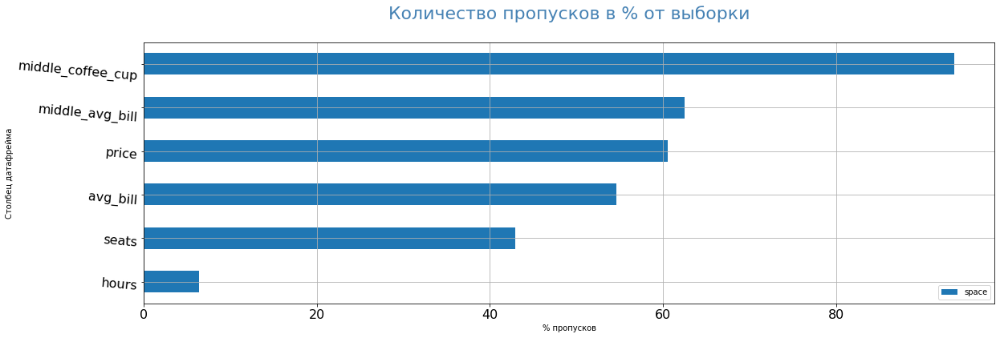

In [16]:
pass_value_barh2(df)

Изучим распределение пропусков по регионам Москвы чтобы иметь полное представление о качестве финальной выборки, также это поможет решить вопрос о заполнении пропусков. У заказчика ислледования нет требований по районам, поэтому требуется сделать комплексную оценку данных, чтобы дать полноценную рекомендацию о локации для открытия заведения. 

Чтобы нагляднее работать с графиками дадим сокращенные названия районам - для этого сформируем аббревиатуры по заглавным буквам названия района + добавим АО (Административный Округ). Новые названия подтянем в основную таблицу с похожим названием.

In [17]:
#сведем общую информацию по количеству и доле заведений в разрезе районов

pivot=df.pivot_table(index=(['district']), values=['name'], aggfunc=({'name' : 'count'})).sort_values(by='name',ascending=False)
pivot['share_of_total'] = pivot['name']/len(df)
pivot

,name,share_of_total
district,,
Центральный административный округ,2242,0.266714
Северный административный округ,900,0.107066
Южный административный округ,892,0.106115
Северо-Восточный административный округ,891,0.105996
Западный административный округ,851,0.101237
Восточный административный округ,798,0.094932
Юго-Восточный административный округ,714,0.084939
Юго-Западный административный округ,709,0.084345
Северо-Западный административный округ,409,0.048656


In [18]:
# формируем аббревиатуры (area) для каждого уникального имени

list=[]
for item in pivot.index:
    res = [char for char in item if char.isupper()]
    list.append(res)
    
areas = pd.DataFrame(list,pivot.index).astype(str)
areas.columns =['1st','2nd']
areas = areas.replace('None', '', regex=True)
areas['area'] = areas['1st']+areas['2nd']+"АО"
areas.drop(['1st', '2nd'], axis=1, inplace=True)
display (areas)


,area
district,
Центральный административный округ,ЦАО
Северный административный округ,САО
Южный административный округ,ЮАО
Северо-Восточный административный округ,СВАО
Западный административный округ,ЗАО
Восточный административный округ,ВАО
Юго-Восточный административный округ,ЮВАО
Юго-Западный административный округ,ЮЗАО
Северо-Западный административный округ,СЗАО


Всего получилось 9 районов

In [19]:
# добавляем "слева" новые аббревиатуры - столбец area

df_merged=pd.merge(
    df,
    areas,
    how="left",
    on='district',
    sort=False,
    copy=False,
    indicator=False,
    validate=None,
)

In [20]:
df_merged.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,area
7824,домино'с пицца,пиццерия,"москва, бирюлёвская улица, 38, стр. 3",Южный административный округ,"пн-чт 10:00–00:00; пт,сб 10:00–01:00; вс 10:00...",55.588212,37.664349,4.2,средние,NaN,NaN,NaN,True,85.0,ЮАО
4533,кафе курвуазье,"бар,паб","москва, малая сухаревская площадь, 8",Центральный административный округ,"ежедневно, круглосуточно",55.772743,37.630271,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,False,86.0,ЦАО
1085,шаурма house,быстрое питание,"москва, анадырский проезд, 17",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.863874,37.682186,4.0,NaN,NaN,NaN,NaN,False,60.0,СВАО
1442,abc coffee roasters,кофейня,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.805547,37.520395,4.5,средние,Цена чашки капучино:220–270 ₽,NaN,245.0,False,625.0,САО
2359,гриль хаус,быстрое питание,"москва, верхняя красносельская улица, 3а",Центральный административный округ,"ежедневно, 09:00–22:00",55.785714,37.664242,4.2,NaN,NaN,NaN,NaN,True,160.0,ЦАО
3590,моди,ресторан,"москва, трубниковский переулок, 11",Центральный административный округ,"ежедневно, 11:00–00:00",55.753076,37.586221,4.4,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,False,80.0,ЦАО
6184,шайба,быстрое питание,"москва, пушкинская набережная",Центральный административный округ,"ежедневно, 10:00–22:00",55.722812,37.591544,4.3,NaN,NaN,NaN,NaN,False,NaN,ЦАО
2720,буфет рокоссовского,кофейня,"москва, открытое шоссе, 9, стр. 15",Восточный административный округ,"пн-пт 07:00–20:00; сб,вс 11:00–20:00",55.815137,37.736327,4.5,низкие,Цена чашки капучино:100–150 ₽,NaN,125.0,False,NaN,ВАО
1284,стамбул дурум,кофейня,"москва, улица народного ополчения, 22",Северо-Западный административный округ,"ежедневно, 11:00–23:00",55.778556,37.479573,5.0,средние,Средний счёт:250–300 ₽,275.0,NaN,False,NaN,СЗАО
3155,гранд фэмили,ресторан,"москва, улица герасима курина, 10, стр. 2",Западный административный округ,"ежедневно, 11:00–00:00",55.732981,37.481154,4.5,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,False,NaN,ЗАО


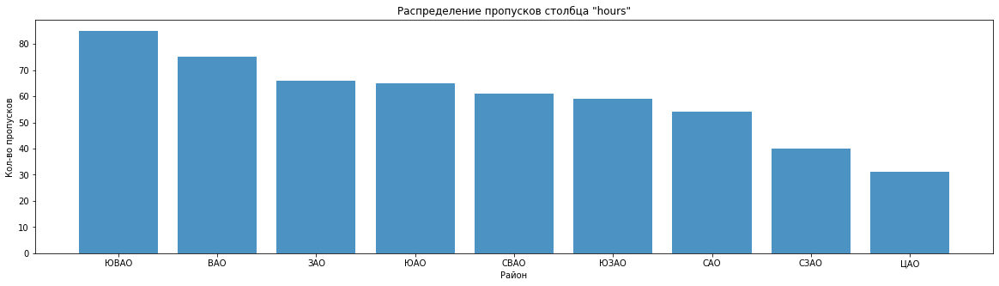

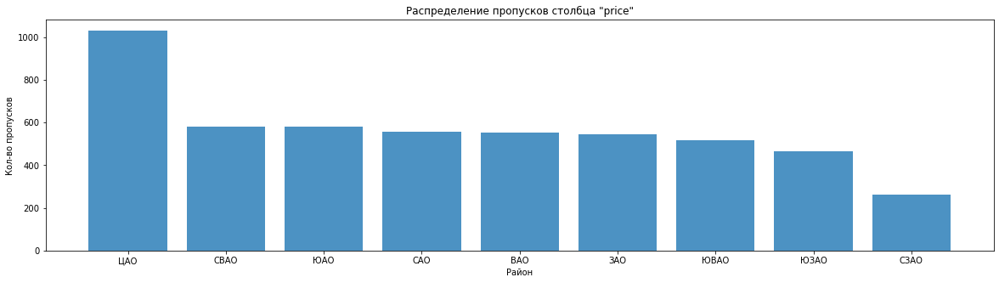

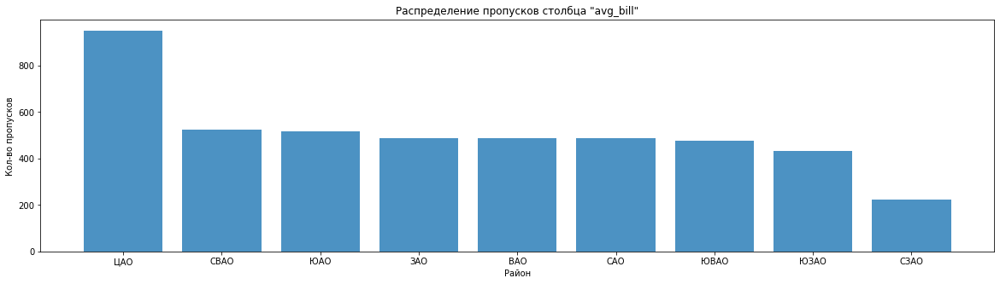

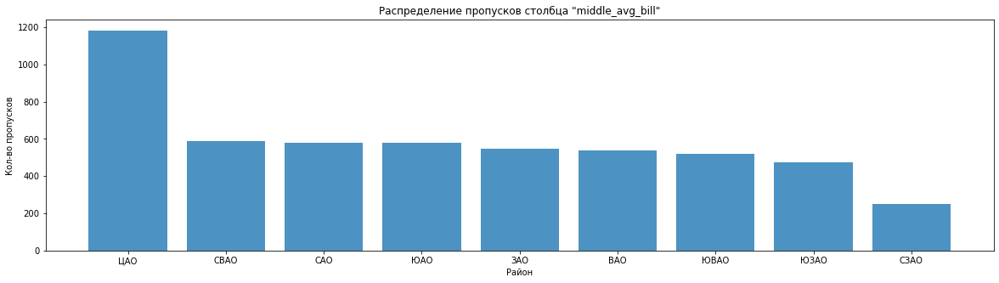

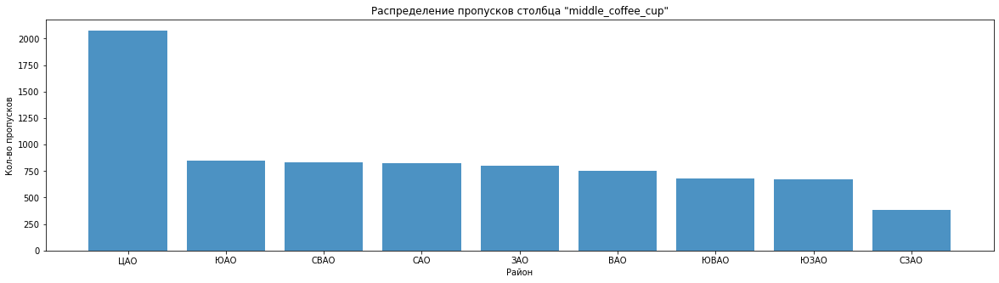

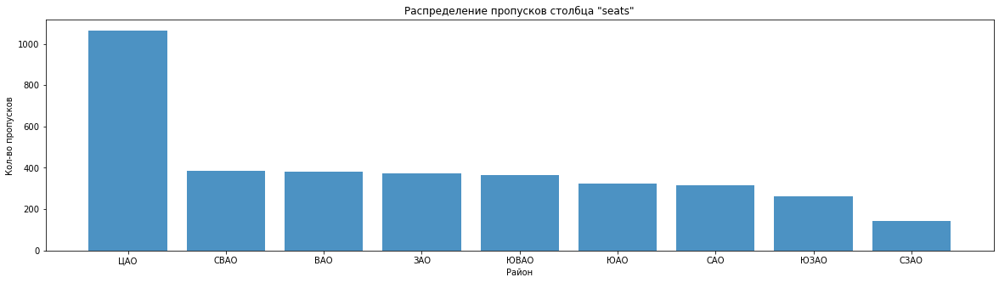

In [21]:
# распределение количества пропусков по районам

for item in ['hours','price','avg_bill','middle_avg_bill','middle_coffee_cup','seats']:
    pivot=df_merged[df_merged[item].isnull()].pivot_table(index=(['area']), values=['name'], aggfunc=({'name' : 'count'})).sort_values(by='name',ascending=False)
    
    plt.figure(figsize=(20, 5))
    plt.bar(pivot.index, pivot.name,alpha=0.8)
    plt.title(f'Распределение пропусков столбца "{item}"')
    plt.xlabel('Район')
    plt.ylabel('Кол-во пропусков')
    plt.show()

Пропуски распределены по районам одинаково, согласно общему распределнию записей - ЦАО везде выделяется в количестве в 2 раза или больше, кроме данных по часам работы. Два столбца с пропущенными данными являются производными avg_bill - средний чек и цена капучино. Заполнять эти три показателя не стоит - они количественные, а avg_bill и price имеют текстовый формат. Будем воспринимать наличие информации - ценным справочным разрезом для некоторого количества данных, а пропуски - особенностью заполнения детализированной информации пользователями сервисов.

Другие пропуски в посадке и времени работы не так многочислены, но также не подаются заполнению по исходной таблице. В целях получения наиболее точных выводов оставим данные как есть, чтобы не усреднять статистику по категориям. Заменим NaN на 'Unknown' для категориальных.

In [22]:
# замена пропусков на 'Unknown'

df_merged[['hours', 'price']] = df_merged[['hours', 'price']].fillna(value='Unknown')

In [23]:
# добавляем название улицы - используем метод str.split чтобы разбить текст по знаку (поле адресс сформировано единобразно)

df_merged['street']=df_merged['address'].str.split(',').str.get(1)

In [24]:
# добавляем boolen переменную работы заведения ежедневно, круглосуточно

df_merged['is_24/7']=df_merged['hours'].str.contains('ежедневно, круглосуточно')

In [25]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8406 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
 14  area               8406 non-null   object 
 15  street             8406 non-null   object 
 16  is_24/7            8406 

В финале оставляем датасет с пропусками в справочных столбцах по стоимости. Прочие пропуски зафиксированы категорией Unknown.
Добавлены сокращенные названия районов и два столбца с названием улицы и обозначением работы круглосуточно ежедневно.

### Шаг 3. Анализ данных <a id="analyze"></a>

In [26]:
df_merged.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего в записях 8 категорий, они довольно разные. Сделаем сводную таблицу и посчитаем 4 метрики, они пригодятся для изучения рынка заведений. Затем представим результаты визуально.

In [27]:
# представим распределение в категориях по разным метрикам (median и mean при этом не работают по NaN)
# %_chain - доля сетей,
# qty - количество заведений,
# avg_rating - средний рейтинг,
# med_seats - медиана посадочных мест 

pivot_dt=df_merged.pivot_table(index=(['category']), values=['name','seats','rating','chain'], aggfunc=({'name' : 'count',
                                                                               'seats' : 'median',
                                                                                'rating' : 'mean',
                                                                               'chain' : 'mean'})).sort_values(by='name',ascending=False)
pivot_dt.columns=['%_chain','qty','avg_rating','med_seats']
display(pivot_dt)

,%_chain,qty,avg_rating,med_seats
category,,,,
кафе,0.327586,2378,4.123886,60.0
ресторан,0.357318,2043,4.290357,86.0
кофейня,0.509554,1413,4.277282,80.0
"бар,паб",0.220915,765,4.387712,82.5
пиццерия,0.521327,633,4.301264,55.0
быстрое питание,0.384743,603,4.050249,65.0
столовая,0.279365,315,4.211429,75.5
булочная,0.613281,256,4.268359,50.0


Сначала изучим популярность форматов - этому показателю соответствует общее количество заведений. Возьмем данные чтобы построить treemap: далее в осях графика это a - популярность, b - формат.

In [28]:
a=pivot_dt.reset_index().qty.values.tolist()
a

[2378, 2043, 1413, 765, 633, 603, 315, 256]

In [29]:
b=pivot_dt.index.get_level_values(0).tolist()
b

['кафе',
 'ресторан',
 'кофейня',
 'бар,паб',
 'пиццерия',
 'быстрое питание',
 'столовая',
 'булочная']

In [30]:
print(plt.style.available) # вызовем разные наборы цветов

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


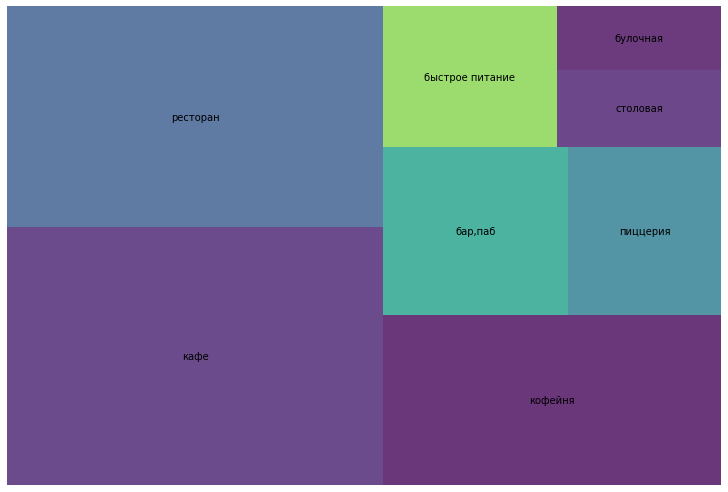

In [31]:
plt.style.use('seaborn-poster') 
squarify.plot(sizes=a,label=b, alpha=.8 )
plt.axis('off')
plt.show()

Больше всего в Москве распространены форматы кафе, ресторана, кофейни. Почти одинаково много пиццерий, баров и точек фастфуда. Самые малочисленные это булочные и столовые. Перейдем к другим показателям по форматам - доле сетей, среднему рейтингу и медиане посадочных мест

In [32]:
# строим бар график по всем показателям, для удобства сравнения масштаб оси x выравнивается по min/max

for item in ['%_chain','avg_rating','med_seats']:
    
    fig = px.bar(
                pivot_dt.sort_values(by=item,ascending= True),
                x=item,
                y=pivot_dt.sort_values(by=item,ascending= True).index,
                range_x=(pivot_dt[item].min()*0.9,pivot_dt[item].max()*1.01),
                orientation='h',
                title=f'Распределение для показателя {item}'
                )
    fig.show()

Самая высокая медиана посадочных мест > 85 человек у ресторанов. Самые маленькие форматы у булочных и пиццерий - они также самые сетевые. Большая посадка у баров, пабов и в кофейнях и столовых - вполне логично, скорее всего для таких форматов более важно количество гостей и они могут занять большую площадь.  Средняя посадка у кафе в 60 человек - для экономики заведений важно не только максимизировать чек, но и снижать затраты. Посмотрим поближе как устроены заведения питания Москвы, учитывая сетевые точки.

In [33]:
share=df_merged.query('chain == True').name.nunique()/df_merged.name.nunique()
print("{:.0%} от всех уникальных заведений составляют сети. А по количеству записей датасета сети составляют {:.0%} от всех. ".format(share,df_merged.chain.mean()))

14% от всех уникальных заведений составляют сети. А по количеству записей датасета сети составляют 38% от всех. 


Более половины заведений в категориях булочные, пиццерии и кофейни - сети. От 33% до 38% сетевых заведений в кафе, ресторанах и фастфуде. Бары и столовые самые несетевые, доля менее 28%.

Усредненные рейтинги по категориям отличаются несильно - в сервисе достаточно высокие оценки пользователей, максимальный рейтинг у баров ~ на 10% выше самого минимального бала 4.05 у фастфуда. В следующей группе с рейтингом выше среднего в категориях - булочные, кофейни, пиццерии, рестораны - у них в районе 4.3. Самые средние оценкии у столовых - 4.2, после идут кафе с 4.12, немного обгоняя фастфуд. Похоже в Москве любят бары и здесь не хватает более качественного фастфуда.


Теперь сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе.

In [34]:
pivot=df_merged.pivot_table(index=(['name']), values=['district','category','chain','middle_avg_bill'], aggfunc=({'district' : 'count',
                                                                               'category' : 'first',
                                                                               'chain' : 'mean',
                                                                                'middle_avg_bill':'mean'})).sort_values(by='district',ascending=False)
display(pivot.head(15))

,category,chain,district,middle_avg_bill
name,,,,
кафе,кафе,0.000000,189,3816.000000
шоколадница,кофейня,1.000000,120,679.166667
домино'с пицца,пиццерия,0.987013,77,503.571429
додо пицца,пиццерия,1.000000,74,388.263889
one price coffee,кофейня,0.986111,72,NaN
яндекс лавка,ресторан,1.000000,69,NaN
cofix,кофейня,1.000000,65,NaN
prime,ресторан,1.000000,50,362.000000
хинкальная,быстрое питание,1.000000,44,1005.263158


В таком разрезе становится понятно, что в датасете есть скрытые дубликаты с неизвестными названиями - таких набирается целых 189 шт, где в названии указано "кафе". В дальнейшем для фильтрации таких случаев используем комбинацию "не сеть" с количеством заведений > 0. Отметим, что самые популярные это кофейни и пиццерии, скорее всего их популярность объединяется с признаком невысокого чека по имеющимся данным. Уточним распределение данных по признаку среднего чека (всего 3816 записей).

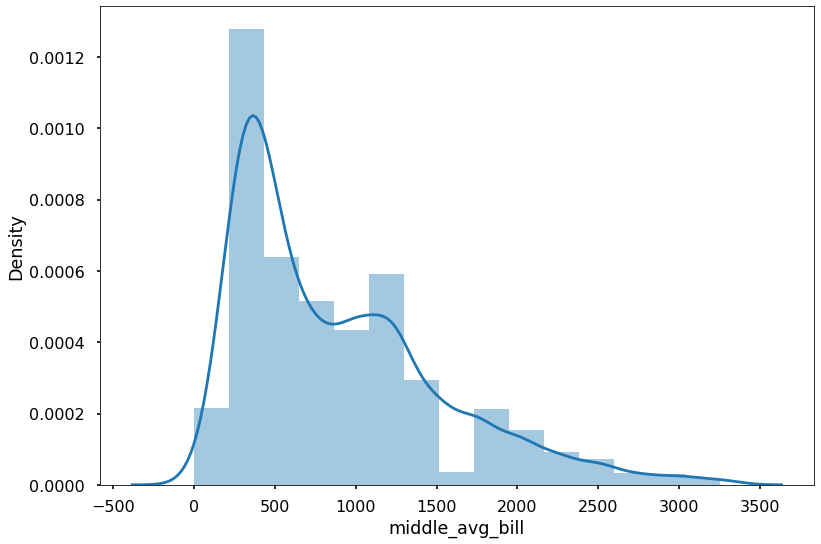

In [35]:
sns.distplot(df_merged[df_merged['middle_avg_bill']<3500]['middle_avg_bill'], bins=15);

In [36]:
# таблица топ-15 сетевых заведений

pivot_top=df_merged.query('chain==1').pivot_table(index=(['name']), values=['district','category','middle_avg_bill'], aggfunc=({'district' : 'count',
                                                                               'category' : pd.Series.mode,                                                                               
                                                                                'middle_avg_bill':'mean'})).sort_values(by='district',ascending=False).reset_index().head(15)
display(pivot_top)

,name,category,district,middle_avg_bill
0,шоколадница,кофейня,120,679.166667
1,домино'с пицца,пиццерия,76,503.571429
2,додо пицца,пиццерия,74,388.263889
3,one price coffee,кофейня,71,NaN
4,яндекс лавка,ресторан,69,NaN
5,cofix,кофейня,65,NaN
6,prime,ресторан,50,362.000000
7,хинкальная,кафе,44,1005.263158
8,кофепорт,кофейня,42,NaN
9,кулинарная лавка братьев караваевых,кафе,39,460.689655


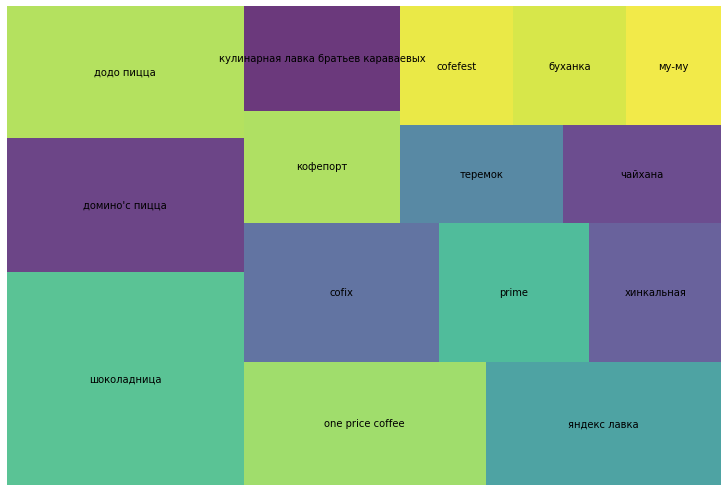

In [37]:
# карта популярности сетевых заведения в московском регионе - чем крупнее фигура, тем больше точек

squarify.plot(sizes=pivot_top['district'],label=pivot_top['name'], alpha=.8 )
plt.axis('off')
plt.show()

In [38]:
# топ-15 сетевых в разрезе категорий со средним чеком

toplist=pivot_top["name"]

pivot_top.groupby('category').agg({'name' : 'count',
                                  'middle_avg_bill': 'mean'}).sort_values(by='name',ascending=False)

,name,middle_avg_bill
category,,
кофейня,5,595.833333
кафе,4,593.532738
ресторан,3,343.913043
пиццерия,2,445.917659
булочная,1,231.250000


In [39]:
(df_merged.query('chain==1 & name in @toplist')

.groupby(['category'])

.agg(name=('name', 'count'), middle_avg_bill=('middle_avg_bill', 'mean'))

.sort_values(by='name', ascending=False)[:15])

,name,middle_avg_bill
category,,
кофейня,336,625.000000
ресторан,186,498.545455
пиццерия,151,426.203704
кафе,100,484.811321
булочная,25,212.500000
быстрое питание,12,400.000000
"бар,паб",4,625.000000
столовая,2,1000.000000


Таким образом самые популярные заведения это кофейни и кафе , 3 ресторана, пара пиццерий, и одно заведене из булочных тоже в топе. Скорее всего на популярность влияет и средний чек - распределение показателя свидетельствует о двух популярных пиках в данных - в районе 400 и 600 руб

Будет логично удалить из датасета некачественные записи, которые могут повлиять на статистику в разрезах по сетям. На распределение исключение такого количество в поле district влияет не сильно - максимальная доля не превысит 10% от категории для кафе и быстрого питания, общие выводы популярности категорий остаются прежними. <a id="filter"></a>

In [40]:
# сформируем таблицу по кафе, где есть противоречия в данных по сети и количеству точек

pivot_fakes=pivot.query(' (chain==1 & district < 2) | (chain==0 & district > 1) ').sort_values(by='district',ascending=False)
display(pivot_fakes)

,category,chain,district,middle_avg_bill
name,,,,
кафе,кафе,0.0,189,3816.000000
шаурма,быстрое питание,0.0,43,223.333333
ресторан,ресторан,0.0,34,NaN
столовая,столовая,0.0,28,300.000000
бистро,быстрое питание,0.0,12,NaN
...,...,...,...,...
роллофф,кафе,1.0,1,400.000000
рома,кафе,1.0,1,NaN
прованс,кафе,1.0,1,NaN


In [41]:
# теперь уберем такие записи чтобы уточнить количественные выводы в дальнейшем анализе

df_filtered=df_merged[~df_merged.name.isin(pivot_fakes.index)]

In [42]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7893 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               7893 non-null   object 
 1   category           7893 non-null   object 
 2   address            7893 non-null   object 
 3   district           7893 non-null   object 
 4   hours              7893 non-null   object 
 5   lat                7893 non-null   float64
 6   lng                7893 non-null   float64
 7   rating             7893 non-null   float64
 8   price              7893 non-null   object 
 9   avg_bill           3724 non-null   object 
 10  middle_avg_bill    3062 non-null   float64
 11  middle_coffee_cup  530 non-null    float64
 12  chain              7893 non-null   bool   
 13  seats              4540 non-null   float64
 14  area               7893 non-null   object 
 15  street             7893 non-null   object 
 16  is_24/7            7893 

Итого из датасета было удалено 429 записей или 5.1%, что не так много, продолжим изучение. Теперь попробуем более детально изучить ситуацию по районам города - это должно помочь определиться с локацией будущего заведения.

Подготовим данные в виде свободной таблицы чтобы, изобразить распределение категорий по районам в виде heatmap. Более яркие участки будут означать более высокую концентрацию на пересечении разрезов.

In [43]:
heat_pivot=df_filtered.pivot_table(index=(['category']), columns = 'area',values=['name'],aggfunc=({'name' : 'count'}))

col_names=[]
for each in heat_pivot.columns:
    col_names.append(each[1]) 
heat_pivot.columns=col_names

In [44]:
heat_pivot


,ВАО,ЗАО,САО,СВАО,СЗАО,ЦАО,ЮАО,ЮВАО,ЮЗАО
category,,,,,,,,,
"бар,паб",50,50,68,61,23,356,64,38,37
булочная,22,37,39,27,11,48,24,13,23
быстрое питание,65,56,53,78,29,79,76,56,53
кафе,224,207,207,237,90,446,239,246,220
кофейня,103,142,189,156,61,423,127,87,92
пиццерия,69,70,75,66,40,105,71,53,62
ресторан,153,211,183,177,103,658,195,135,162
столовая,34,19,34,37,13,62,42,20,12


In [45]:
# назначим переменные для построения графика

plot = heat_pivot.reset_index().loc[0:len(heat_pivot), heat_pivot.columns[0]:].to_numpy() # внутренний участок сводной
cats=heat_pivot.index.to_list() # список категорий
areas=heat_pivot.columns.to_list() # список районов



Построим график распределения <a id='section_id1'></a>

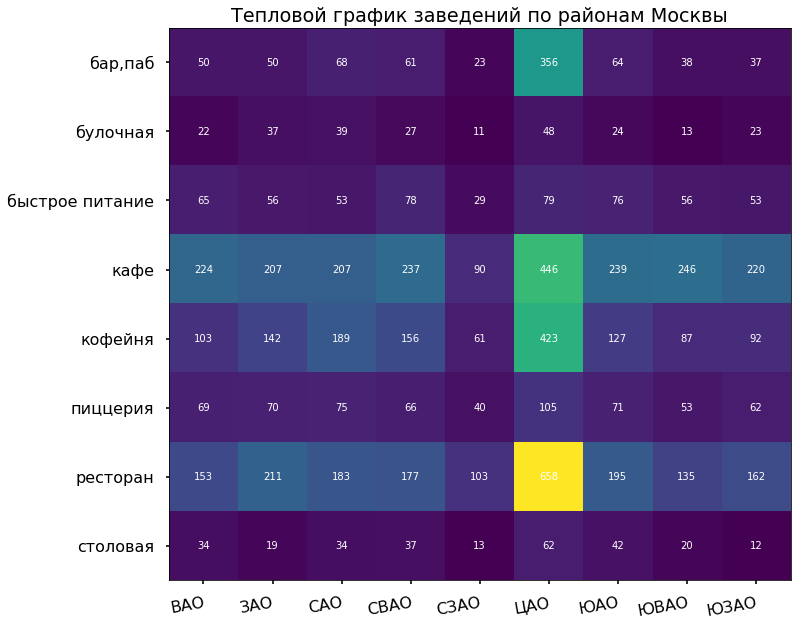

In [46]:
fig, ax = plt.subplots()
im = ax.imshow(plot)

# выводим все подписи на график
ax.set_xticks(np.arange(len(areas)))
ax.set_yticks(np.arange(len(cats)))
ax.set_xticklabels(areas)
ax.set_yticklabels(cats)
# слегка подвернем названия в оси x для удобства чтения
plt.setp(ax.get_xticklabels(), rotation=10, ha="right",
         rotation_mode="anchor")

# устанавливаем подписи - количество заведений к каждой ячейке
for i in range(len(cats)):
    for j in range(len(areas)):
        text = ax.text(j, i, plot[i, j],ha="center", va="center", color="w")

ax.set_title("Тепловой график заведений по районам Москвы")
fig.tight_layout()
plt.show()

Наибольшая концентрация заведений - рестораны в центральном районе Москвы. Помним этот район лидирует во всех категориях по числу заведений. Интересно, что многочисленные кафе распределены по районам достаточно равномерно по 208-250 заведений на район, кроме ЦАО (где наибольшее количество) и СЗАО (наименьшее кол-во заведений). 

In [47]:
# читаем файл с полигонами и сохраняем в переменной для будущей карты
try:
    with open(r'C:\Users\kslvd\pyn_projects\yandex_projects\food_invest\admin_level_geomap(7).geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except: 
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

In [49]:
# сформируем средний рейтинг по районам чтобы отразить его на будущей карте

rating_df = df_filtered.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [50]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_filtered.apply(create_clusters, axis=1)
# выводим карту
m

Самые высокие рейтинги у заведений в центре, средние повсюду, кроме юго-востока.

In [51]:
# найдем топ-15 улиц по количеству заведений

top15streets=df_filtered.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name',ascending=False).head(15)
top15streets

,street,name
815,проспект мира,177
819,профсоюзная улица,112
812,проспект вернадского,104
517,ленинский проспект,104
515,ленинградский проспект,91
366,дмитровское шоссе,84
445,каширское шоссе,71
291,варшавское шоссе,71
516,ленинградское шоссе,70
593,мкад,53


In [52]:
# создадим сводную таблицу чтобы изучить характеристики заведений топ-15 улиц

rue_pivot=df_filtered.query('street in @top15streets.street').pivot_table(index=(['street']), columns = 'category',values=['name'],aggfunc=({'name' : 'count'}))

col_names=[]
for each in rue_pivot.columns:
    col_names.append(each[1]) 
rue_pivot.columns=col_names

rue_pivot

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
варшавское шоссе,6.0,NaN,5.0,17.0,13.0,4.0,20.0,6.0
дмитровское шоссе,6.0,2.0,10.0,21.0,11.0,8.0,22.0,4.0
каширское шоссе,2.0,NaN,9.0,18.0,16.0,3.0,18.0,5.0
кутузовский проспект,2.0,1.0,2.0,12.0,13.0,3.0,16.0,3.0
ленинградский проспект,15.0,4.0,1.0,12.0,24.0,8.0,24.0,3.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
ленинский проспект,10.0,3.0,2.0,26.0,21.0,5.0,33.0,4.0
люблинская улица,5.0,NaN,1.0,24.0,10.0,1.0,10.0,2.0
мкад,NaN,NaN,7.0,36.0,4.0,NaN,5.0,1.0


In [53]:
# повторным образом отразим данные на хитмеп, найдем самые яркие и темные участки

plot = rue_pivot.reset_index().loc[0:len(rue_pivot), rue_pivot.columns[0]:].to_numpy()
cats=rue_pivot.columns.to_list()
street=rue_pivot.index.to_list()

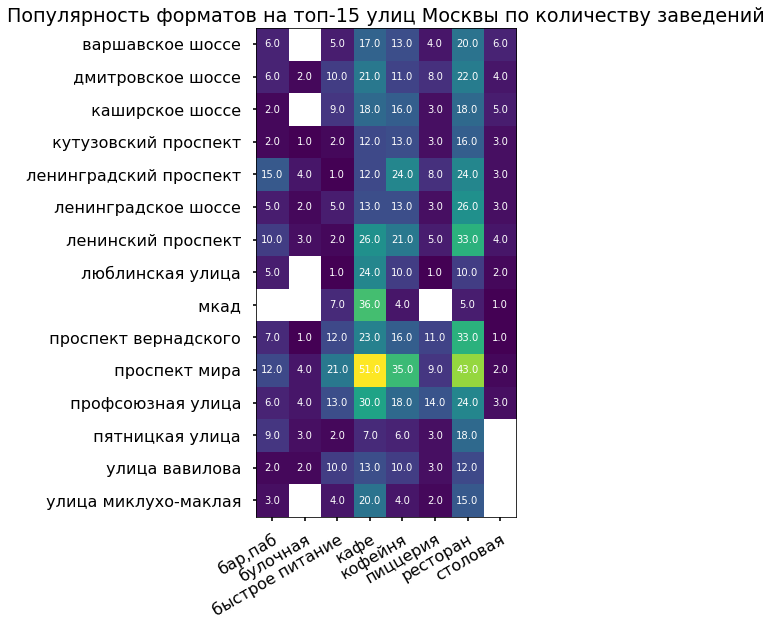

In [54]:
fig, ax = plt.subplots()
im = ax.imshow(plot)

ax.set_xticks(np.arange(len(cats)))
ax.set_yticks(np.arange(len(street)))

ax.set_xticklabels(cats)
ax.set_yticklabels(street)

plt.setp(ax.get_xticklabels(), rotation=30, ha="right",
         rotation_mode="anchor")

for i in range(len(street)):
    for j in range(len(cats)):
        text = ax.text(j, i, plot[i, j],ha="center", va="center", color="w")

ax.set_title("Популярность форматов на топ-15 улиц Москвы по количеству заведений")
fig.tight_layout()
plt.show()

Итак, самая густонаселенная локация - проспект Мира. Проспекты и шоссе в рейтинге вообще в избытке - это длинные участки, где сосредоточено множество заведений. Выделяются концентрацией кафе на МКАДе - есть такая потребность в дороге и там отсутствуют бары, булочные и пиццерии. На топ-15 улицах совсем малое количество булочных, столовых. Посмотрим на распределение на улицах, где по записям лишь одно заведение.

In [55]:
#создаем список улиц с единичными заведениями

onestreets=df_filtered.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name',ascending=True)
onestreets_list=onestreets[onestreets['name']==1]['street']

In [56]:
# распределение по категориям единичных на улице заведений

df_filtered.query('street in @onestreets_list').groupby('category').agg({'name' : 'count',
                                  'rating': 'mean',
                                  'seats': 'median',
                                  'middle_avg_bill': 'mean'}).sort_values(by='name',ascending=False)

,name,rating,seats,middle_avg_bill
category,,,,
кафе,150,4.148000,42.0,663.739130
ресторан,95,4.246316,49.0,1717.777778
кофейня,89,4.323596,35.0,569.642857
"бар,паб",41,4.492683,50.0,1400.000000
столовая,36,4.305556,80.0,280.952381
быстрое питание,26,4.096154,30.0,702.777778
пиццерия,18,4.355556,39.0,760.272727
булочная,10,4.300000,10.0,NaN


На улицах с одним заведением такие же лидеры - кафе,рестораны,кофейни. Но здесь меньше пиццерий, компактнее заведения, похожее распределение чека с двумя притяжениями 500-700 и 1400-1700 руб. Изучим как выглядят районы по среднему чеку, с учетом имеющихся данных. Положим окраску на карту.

In [57]:
avgbill_df = df_filtered.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avgbill_df

,district,middle_avg_bill
0,Восточный административный округ,600.0
1,Западный административный округ,1000.0
2,Северный административный округ,700.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,750.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,650.0
8,Южный административный округ,500.0


In [58]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=avgbill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(bill)

# выводим карту
bill

Самими дорогими оказались ЦАО и ЗАО. Самые доступные заведения можно встретить в ЮВАО, ЮАО и СВАО

Чтобы ответить на вопрос о наличии связи между удалением от центра и величины среднего чека следует подготовить данные. 
Можно наглядно увидеть связь на скатер графике, для этого заведем переменную удаление от центра - distance. Для каждого объекта она будет вычисляться как сумма разностей в градусах ширины и долготы от центральной точки Москвы (moscow_lat, moscow_lng = 55.751244, 37.618423).

In [59]:
df_filtered['distance'] = abs(df_filtered['lat']-moscow_lat)+abs(df_filtered['lng']-moscow_lng)

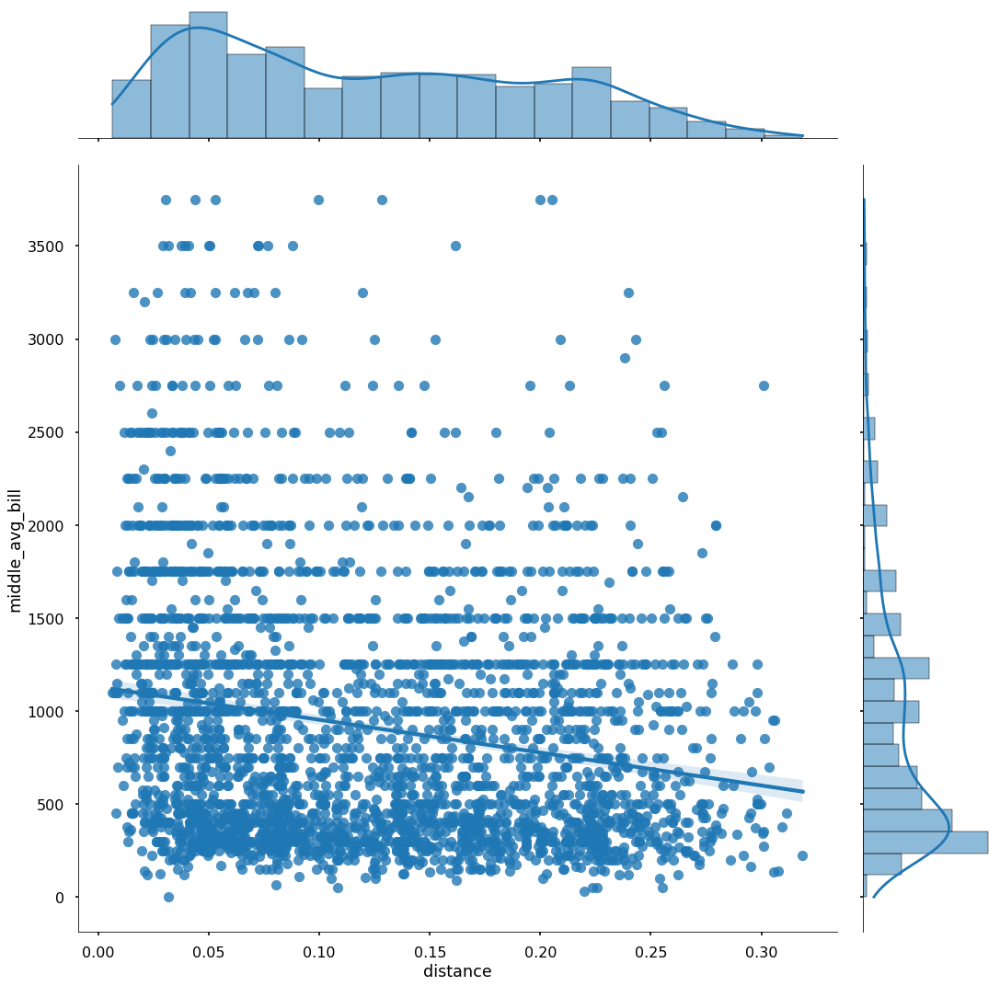

In [60]:
sns.jointplot(x="distance", y="middle_avg_bill", data=df_filtered[df_filtered['middle_avg_bill']<4000], kind='reg',height=15)

В осях графика дистанция и средний чек, наклон графика линейной регрессии говорит о наличии тенденции в данных - чем дальше от центра, тем дешевле. Сопутствующие распределения свидетельствуют, что с удалением от центра равномерно сокращается количество заведений. А для среднего чека - снова видим локальные максимумы 300-500 руб и 1000-1500.

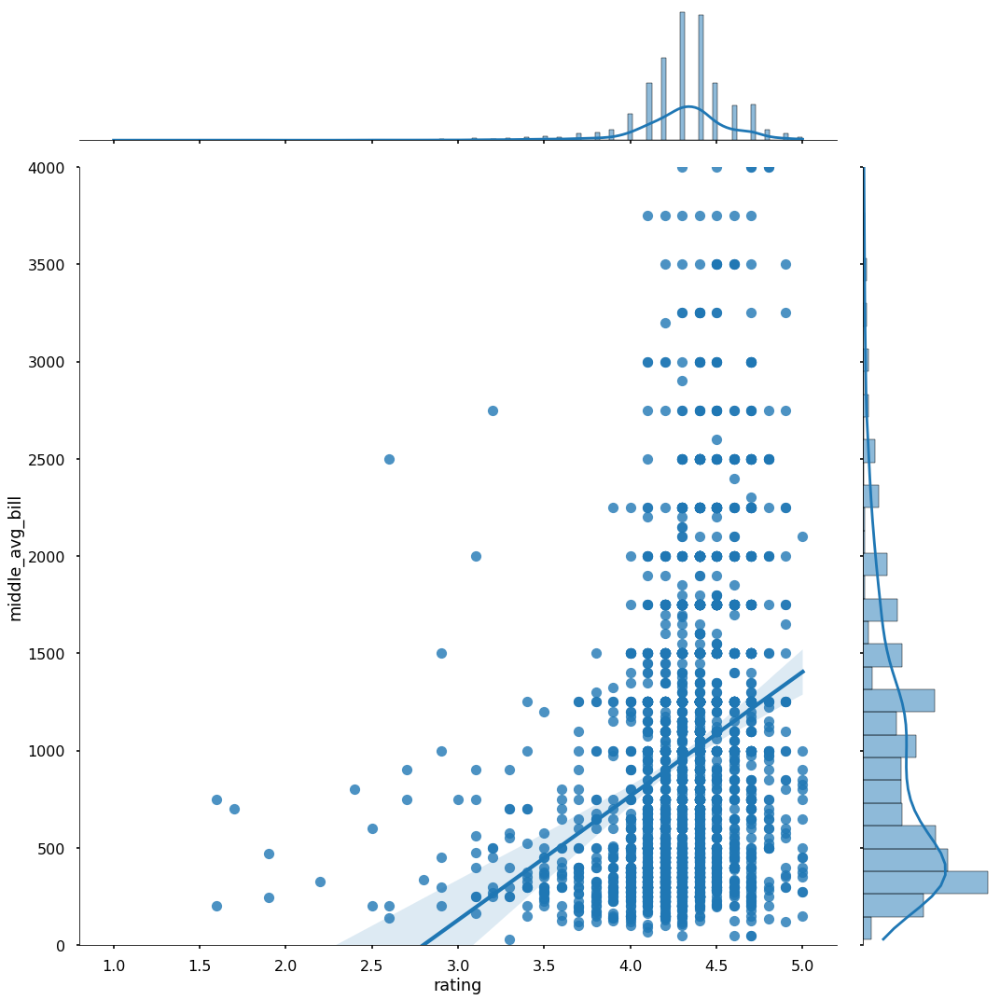

In [61]:
sns.jointplot(x="rating", y="middle_avg_bill", data=df_filtered[df_filtered['middle_avg_bill']>0], kind='reg',height=15, ylim=(0, 4000))

Интересной особенностью также является положительная зависимость цен в заведении и его рейтинга - значит оценки пользователей теоретически могут здорово влиять на спрос, это важная закономерность для успешного заведения любого формата.

**Общий вывод**

В ходе исследования были изучены заведения общественного питания города Москвы почти по 8000 записям по состоянию на лето 2022 года(9 районов, 8 категорий). Обладая полными данными о местонахождении и категории заведения удалось понять распределение и популярность на карте города по районам. 27% заведений находятся в ЦАО, в остальных районах распределение равномерное по 8-10% от общего числа, меньше всего точек в СЗАО - 5%. Сети составляют 38% всех заведений, а в булочных, кофейнях и пиццериях таких более 50%. У последних трех категорий средний рейтинг выше среднего. Самый популярный формат кафе, ресторанов и кафеен обычно расчитан на прием гостей минимум на 20% больше, чем самые компактные булочные с медианой посадки 50 человек. 

Итак, заведения питания характеризуются крайне высокой плотностью в центральной части, однако присутствуют и большие скопления вдоль проспектов и шоссе. Используя данные из общедоступных сервисов удается сделать дополнительные выводы о среднем чеке заведения (3094 записи в итоговой выборке). На общих данных существуют два выраженных притяжения среднего чека - 400 руб и 1300 руб. Самым популярным заведениям по количеству точек как раз соответсвуют такие цены, можно считать их средними для любых форматов. Также топ-3 формата из 15 самых популярных сетевых заведений по количеству точек оказались кофейни, рестораны и пиццерии - самые востребованные форматы у горожан. Не обращаясь в детали по карте концентрации заведений следует отметить достаточно равномерное распределение самых популярных форматов кафе, рестороранов и кофеен по районам с одинаковой посадкой в СЗАО (опуская самый популярный ЦАО). Чтобы лучше понять распределение по районам следует обогатить данные посетителями. Тогда можно будет сравнить относительные показатели и понять недостаток/избыток заведений на посетиля в среденем.

В топ-15 проходных улиц с заведениями попал МКАД с множеством кафе, а в лидерах по общему числу - проспект Мира, Профсоюзная и проспект Ленина. В данных сервиса достаточно высокие оценки пользователей, максимальный рейтинг у баров ~ на 10% выше самого миинимального бала 4.05 у фастфуда. В следующей группе с рейтингом выше среднего в категориях - булочные, кофейни, пиццерии, рестораны - у них в районе 4.3. Самые средние оценкии у столовых - 4.2, после идут кафе с 4.12, немного обгоняя фастфуд. Похоже в Москве любят бары и здесь не хватает качественного фастфуда. По районам в рейтингах выделяется только ЦАО - выше среднего и ЮВАО - ниже среднего. При помощи визуализации удалось установить положителньую линейную зависисимость между рейтингом и чеком: лучше рейтинг, выше чек, разметка в среднем чеке коррелирует с картой рейтингов с разницей по району ЗАО (переоценен в чеке) и СВАО (недооценен). Также средний чек падает по мере удаления из центра.

###  Шаг 4. Детализируем исследование: открытие кофейни <a id="coffee"></a>

**Задача** : Определить лучшие параметры для открытия доступной кофейни. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. 

In [62]:
print('В данных отобранных для исследования содержатся записи по {} заведениям формата кофейня, {} из них с уникальными названиями'.format(len(df_filtered[df_filtered['category']=="кофейня"]), df_filtered[df_filtered['category']=="кофейня"]['name'].nunique() ) )

В данных отобранных для исследования содержатся записи по 1380 заведениям формата кофейня, 811 из них с уникальными названиями


Больше всего кофеен находится в ЦАО и САО, наименьшее в СЗАО (смотреть [График распределения](#section_id1)). Эта категория сильно централизована как и рестороны - сконцентрированое множество заведений центра минимум в 2-3 раза превосходит количество в остальных районах. Кофейни городской среды следуют за кафе и ресторанами - как ближайшая альтернатива по месту приема пищи и пребывания. Это также заметно ниже на графике распределения плотности значений дистанции кофеен от центра. Средний рейтинг кофе точки 4.28 почти совпадает с медианой, разброс в оценках достаточно низкий. Имея под руками рейтинги из других городов можно было сделать вывод об удовлетворенности потребителей. В целом можно судить, что оценки достаточно высоки по 5-ти бальной шкале.

In [63]:
# выведем датасет с кофейнями в отдельный срез

coffee=df_filtered.query('category=="кофейня"')
coffee.rating.describe()

count    1380.000000
mean        4.281667
std         0.367957
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

<AxesSubplot:xlabel='distance', ylabel='Density'>

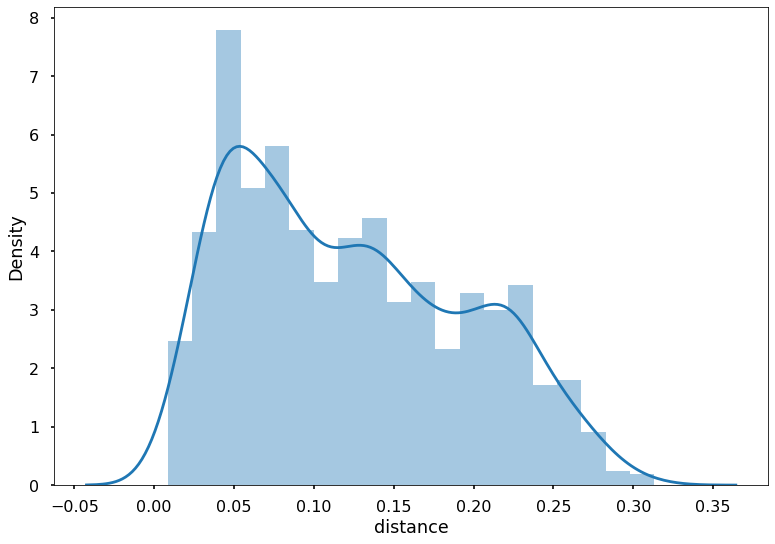

In [64]:
# распределение кофеен по удаленности из центра

sns.distplot(coffee['distance'], bins=20)

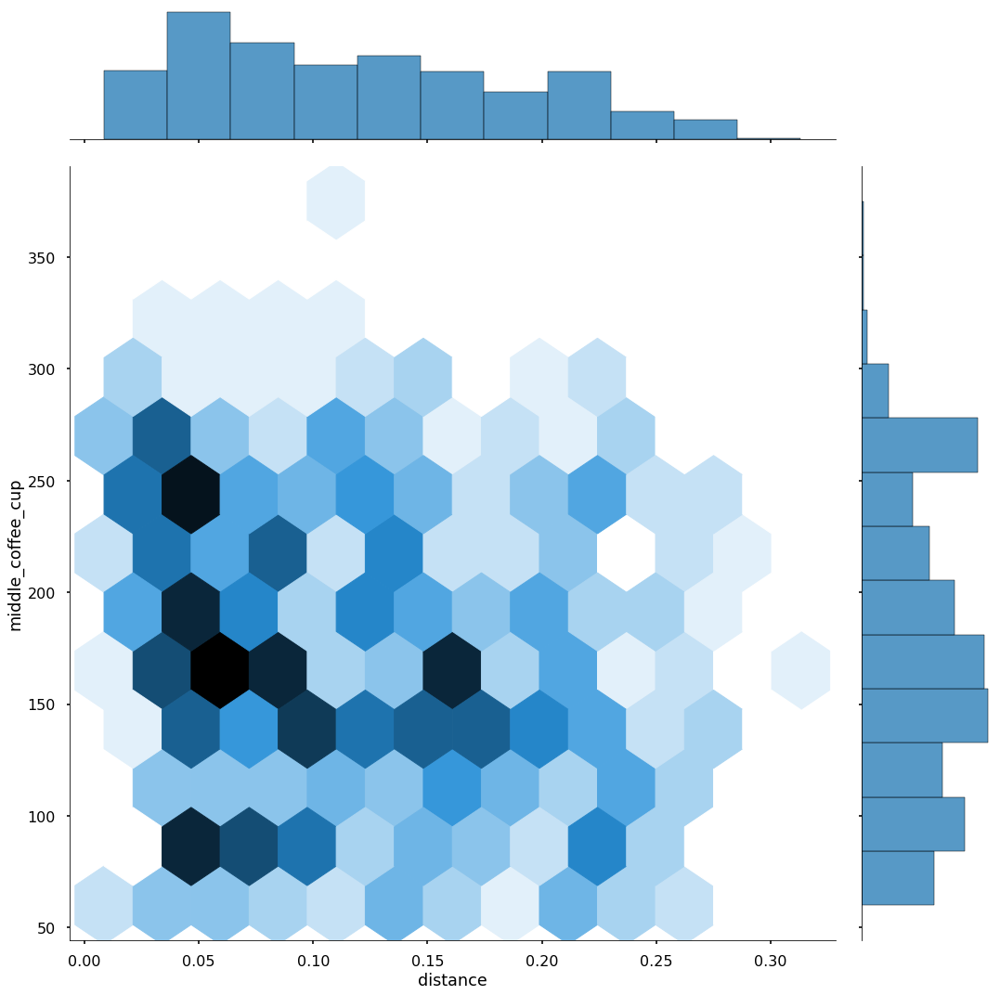

In [65]:
# график зависимости удаленноости от центра и среднего чека

sns.jointplot(x="distance", y="middle_coffee_cup", data=coffee[coffee['middle_coffee_cup']<1500], kind='hex',height=15)

В осях удаленности и средней стоимости чашки кофе видим несколько очагов. Во-первых из-за большого скопления кофеен в центре ярко выражается три категории цен - около 100 руб, 150-180 руб и 250 руб - скорее всего так влияет ассортимент американо/капучино или размер стаканчика. Более глобальный вывод такой же как и со всеми ценами для заведений - с удалением средняя цена падает из области 150-250 руб к 120-180 руб. Поэтому расположение точки будет заставлять подстраиваться под локальные рыночные цены.

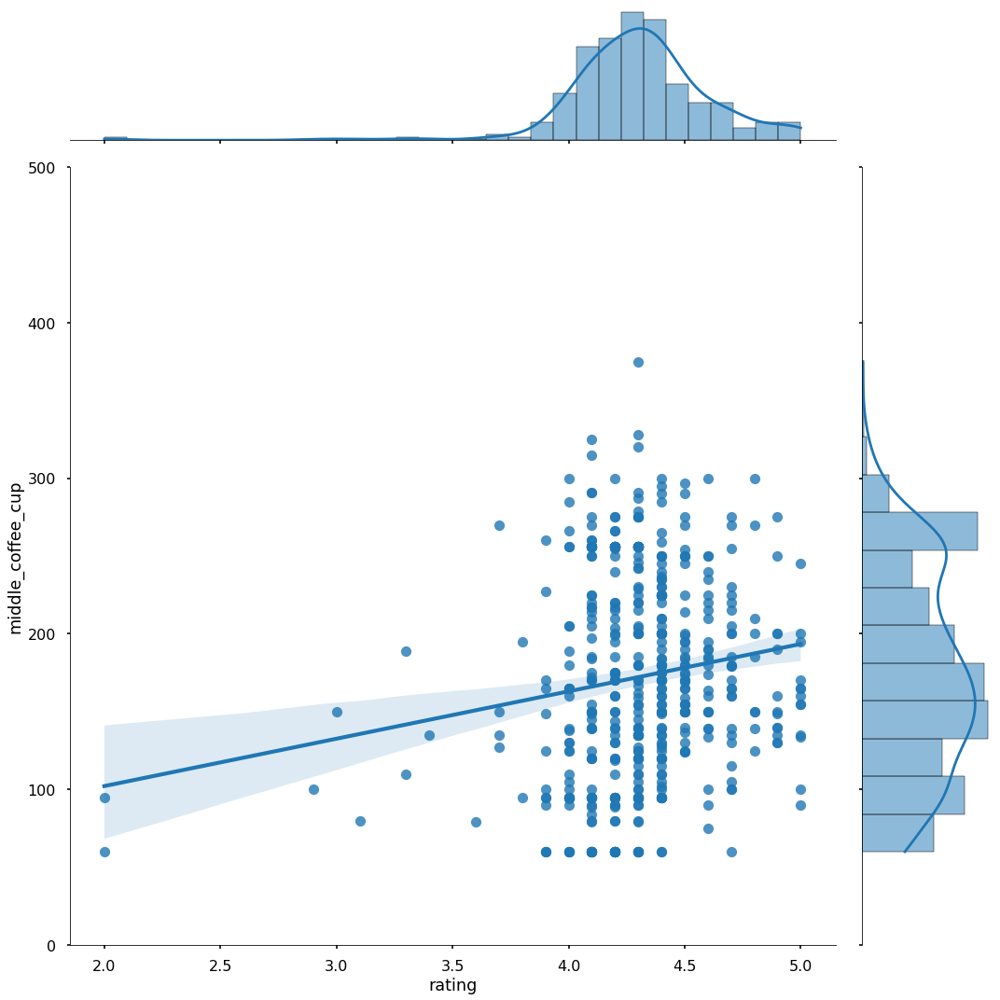

In [66]:
# связь рейтинга и средней стоимости одной чашки 

sns.jointplot(x="rating", y="middle_coffee_cup", data=coffee[coffee['middle_coffee_cup']<1500], kind='reg',height=15, ylim=(0, 500))

Похожий на общий вывод по среднему чеку - чем выше рейтинг, тем выше и цена за чашку. Но надо обратить внимание, что наклон кривой не такой сильный, как графике общего чека. Количества наблюдений вполне достаточно - записи о ценах есть у 534 заведений из 1392 в выборке. Изучим круглосуточные точки с кофе.

In [67]:
# отразим основные параметры сразу в сводной таблице, фильтр coffee['is_24/7']==1

pivot_coffee=coffee[coffee['is_24/7']==1].pivot_table(index=(['area']), values=['name','seats','rating','chain'], aggfunc=({'name' : 'count',
                                                                               'seats' : 'median',
                                                                                'rating' : 'mean',
                                                                               'chain' : 'mean'})).sort_values(by='name',ascending=False)
pivot_coffee.columns=['%_chain','qty','avg_rating','med_seats']
display(pivot_coffee)

,%_chain,qty,avg_rating,med_seats
area,,,,
ЦАО,0.769231,26,4.288462,146.0
ЗАО,0.888889,9,4.200000,48.0
ЮЗАО,0.714286,7,4.271429,48.0
ВАО,1.000000,5,4.300000,49.0
САО,1.000000,5,4.220000,20.0
СВАО,1.000000,3,3.866667,12.5
СЗАО,1.000000,2,4.250000,200.0
ЮАО,1.000000,1,4.000000,0.0
ЮВАО,1.000000,1,2.300000,NaN


Круглосуточные кофейни преобладают в ЦАО, концентрация заведений заставляет ловить там покупателя кофе каждую минуту. Преимущественно в таком режиме работают сетевые кофейни - они способны поглощать издержки и оптимизировать ночной график работы. Достаточно много таких кофеен также в ЗАО - там рейтинг на низкой отметке при среднем в 4.3, видимо присутствует недовольство потребителей. Также заведения там гораздо меньше по площади посадки.

In [68]:
# сформируем средний рейтинг по районам чтобы отразить его на карте

rating_coffee = coffee.groupby('district', as_index=False)['rating'].agg('median')
rating_coffee

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [69]:
# создаём карту Москвы
rating_coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(rating_coffee_map)

# выводим карту
rating_coffee_map

Похоже что-то не так со всеми заведениями в ЗАО - единственный район, который выделяется по параметру рейтинга вниз. Может как раз здесь не хватает точки с хорошим кофе и обслуживанием?

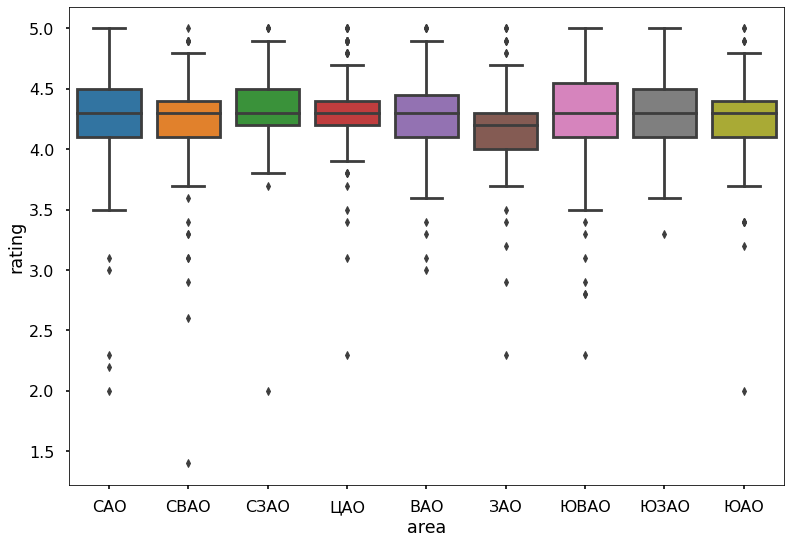

In [70]:
# boxplot для переменной рейтинга по районам

ax = sns.boxplot(x="area", y="rating",data=coffee)


Сверху на диаграмме средние по районам выстроились в линию достаточно наглядно - выпадает уже известный ЗАО, здесь ситуация с оценками действительно похуже. При этом не так велик размах между 25 и 75 квантилей (по сравнению с ЮВАО и САО), т е здесь оценки присваиваются в одном диапазоне стабильнее. 
Самые хорошие отзывы в ЦАО и СЗАО - 25% ото всех заведений имеют оценку ниже 4.25

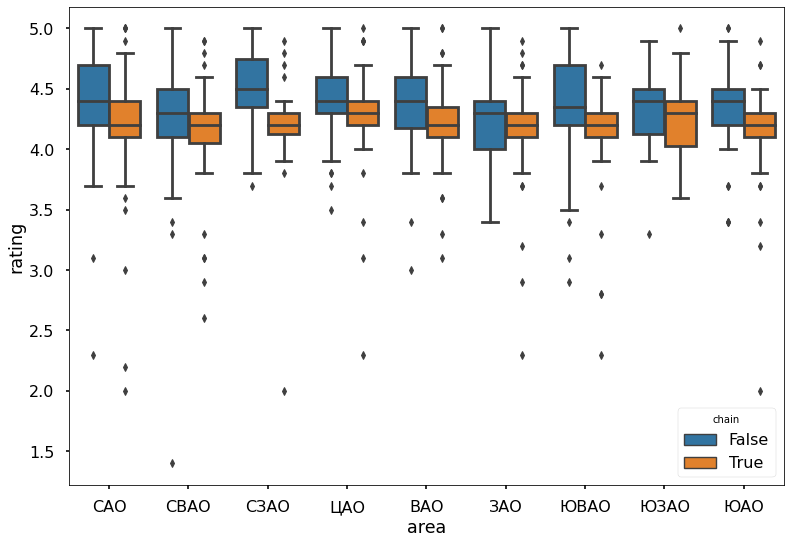

In [71]:
# boxplot для переменной рейтинга по районам в разбивке сетей

ax = sns.boxplot(x="area", y="rating", hue="chain",data=coffee)

In [72]:
# топ-10 улиц для кофеточки

reco=coffee.query('area=="ЗАО"').pivot_table(index=(['street']), values=['name','seats','rating','chain','middle_coffee_cup'], aggfunc=({'name' : 'count',
                                                                               'seats' : 'median',
                                                                                'rating' : 'mean',
                                                                               'chain' : 'mean',
                                                                               'middle_coffee_cup' : 'mean'})).sort_values(by='name',ascending=False)
reco.columns=['%_chain','cup_cost','qty','avg_rating','med_seats',]
display(reco.head(10))

,%_chain,cup_cost,qty,avg_rating,med_seats
street,,,,,
проспект вернадского,0.687500,188.75,16,4.131250,160.0
кутузовский проспект,0.769231,201.00,13,4.300000,96.0
береговой проезд,0.555556,171.25,9,4.200000,140.0
ярцевская улица,0.857143,200.00,7,4.142857,276.0
верейская улица,0.666667,157.00,6,3.950000,NaN
площадь киевского вокзала,0.833333,152.50,6,4.133333,300.0
улица барклая,0.600000,60.00,5,4.300000,41.0
рублёвское шоссе,1.000000,213.00,5,4.240000,70.0
улица покрышкина,0.750000,164.50,4,3.825000,110.0


Имеющийся набор данных позволяет ознакомится с устройством сферы заведений общественного питания г. Москвы, подчеркнуть закономерности в структуре, включая географические признаки. Однако полный вывод и рекомендацию об открытии точки следует делать на основе комплексной оценки вместе с прогнозом доходности, затрат и обогощенной информации по посетителям/жителям района, проходимости на улице и подобное. Рекомендации по локации относительно отзывов, рейтингов и среднего чека за кружку кофе - ЗАО.

Это достаточно населенный кофейнями район (не учитывая ЦАО), что подразумевает наличие конкуренции (этого как раз не боятся заказчики). В свою очередь выбор района дает ряд преимуществ - чек здесь выше среднего и не хватает нового заведения на 5 баллов, чтобы исправить выпадающую из ряда высоких оценок города ситуацию в районе. Хорошие оценки пользователей могут быть напрямую связаны с успешностью предприятия, особенно на старте. Далее необходимо отталкиваться от опыта в его организации и размахе. Это может быть сетевое заведение - у них похуже с рейтингом, но есть и свои плюсы. В кофейнях 1/3 всех заведений сетевые. При открытии следует расчитывать на цену одной чашки по более низкому среднему диапазону - все таки удаленность от ЦАО тоже работает. Это примерно 150-180 рублей.

Возможно лучше всего располагать кофейню рядом с действующими кафе и ресторанами - это соотвествует общему распределению в категориях. Если следовать логике конкуренции с другими кафе за качество и количество - то могут подойти улицы с большим ценником из таблицы топ-10: Ярцевская улица с более низким рейтингом и высоким чеком или всерьез заняться самым низким рейтингом на Верейской улице. Также действенной стратегией может стать открытие точки на Рублевском шоссе - здесь только сети. А распределение рейтингов на boxplot свидетельствует что у несетевых точек получается лучше удовлятворять спрос потребителей на кофе, а значит и извлекать прибыль.

Московский рынок явно насыщен кофейнями (в топ-3 категории), особенно относительно других городов России, так как кофе является неотъемлемой частью деловой среды. Поэтому стратегия "делай лучше, чем другие" вполне способна себя оправдать для района ЗАО - выявленные факты из датасета подтверждают благоприятную возможность.

###  Шаг 5. Приложение презентация <a id="presentation"></a>

Презентация: <https://disk.yandex.ru/i/uE1t8QgqdLfTZg>